In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Rare Neurological Diseases MRI Classification**
### *Feature Extraction vs Transfer Learning under a Limited Data Regime*

**Summary notebook: shows methodology, results and model selection**

---

Rare neurological diseases suffer from **diagnostic delays** averaging five to seven years, the so-called
*diagnostic odyssey*. A major contributing factor is the scarcity of annotated imaging data: with a few
hundred documented cases worldwide, a condition simply does not accumulate the tens of thousands of
labelled examples that modern deep learning normally assumes.

This project does not want to know if the models chosed can classify correctly these five disease.
Instead, wants to answer an important question for this domain:

> **Which transfer-learning strategy degrades more gracefully when annotated data becomes scarce?**

Two strategies are compared on identical data, identical splits and an identical random seed:

| | Strategy 1 | Strategy 2 |
|---|---|---|
| Backbone | ResNet-50 (2015) | ConvNeXt-Tiny (2022) |
| Weights | **frozen**, ImageNet | last stage **fine-tuned** |
| Classifier | linear SVM on 2048-D features | 5-way linear head, end-to-end |
| Trainable parameters | 0 | 14.3 M |

The best-performing model is then served through a *FastAPI application*, containerised with Docker.

**This notebook presents the analysis done**

> *The two source notebooks (`01_resnet50_svm.ipynb`,
`02_convnext-tiny_ft.ipynb`) contain the executable pipeline*


In [ ]:
# Figures are read from the folders produced by the two notebooks in drive
# adjust BASE_DIR if the project lives elsewhere
from pathlib import Path
from IPython.display import Image, display, Markdown

BASE_DIR = Path('/content/drive/MyDrive/University/rare-neuro-mri')  # same path used for nb01 & nb02
RESNET_FIGS   = BASE_DIR / "resnet utils"
CONVNEXT_FIGS = BASE_DIR / "convnext utils"
GUI_IMG = BASE_DIR / "gui_screen"

# fall back to a local ./figures folder when running outside Colab
if not RESNET_FIGS.exists():
    RESNET_FIGS = CONVNEXT_FIGS = Path("figures")

def show(path, width=900):
    """Display a saved figure, or a clear placeholder if it is missing."""
    p = Path(path)
    display(Image(filename=str(p), width=width)) if p.exists() else print(f"[missing] {p}")

print(f"ResNet figures  : {RESNET_FIGS}")    # path for resnet utils
print(f"ConvNeXt figures: {CONVNEXT_FIGS}")  # path for convnext utils
print(f"GUI screens     : {GUI_IMG}")             # path for gui's screen

ResNet figures  : /content/drive/MyDrive/University/rare-neuro-mri/resnet utils
ConvNeXt figures: /content/drive/MyDrive/University/rare-neuro-mri/convnext utils
GUI screens     : /content/drive/MyDrive/University/rare-neuro-mri/gui_screen


---

## **1) The dataset**

### 1.1 *Source and provenance*

**Rare Neurological Diseases MRI — Curated Edition**, from
[Kaggle](https://www.kaggle.com/datasets/ahsanneural/rare-neurological-diseases-mri-curated-edition)

The curated edition derives from the *Benchmark Diagnostic MRI and Medical Imaging Dataset* published on
Mendeley Data by Hassan, Akram, Ahmad and Khawaja (*2024*). The curator selected *400* images per condition
from a larger pool — the source filenames preserved in `metadata.csv` reach indices between *592* and
*1064* per class — and organised them into a fixed `train/validation/test` split.

### 1.2 *The five conditions*

All five are genuinely rare, which is what makes the low-data question meaningful rather than academic:

| Disease | ORPHA | Prevalence | Category | Inheritance |
|---|---|---|---|---|
| **Walker-Warburg Syndrome** (WWS) | ORPHA:899 | 1–9 / 1 000 000 | Congenital muscular dystrophy | Autosomal recessive |
| **Pachygyria with Cerebellar Hypoplasia** | ORPHA:2524 | < 1 / 1 000 000 | Malformation of cortical development | Unknown |
| **Moyamoya Disease with IVH** | ORPHA:2573 | 1–5 / 100 000 | Cerebrovascular disease | Multigenic |
| **Hallervorden-Spatz / PKAN** | ORPHA:157850 | 1–2 / 1 000 000 | Neurodegeneration with brain iron accumulation | Autosomal recessive |
| **Fukuyama Muscular Dystrophy** (FCMD) | ORPHA:272 | 1–5 / 100 000 (Japan) | Congenital muscular dystrophy | Autosomal recessive |

Observations about the dataset:

- **Walker-Warburg and Fukuyama belong to the same category** — congenital muscular dystrophies, both
  presenting cobblestone lissencephaly. Any confusion between them is clinically plausible rather than a
  sign of a broken model
- At these prevalences, *400* images per condition cannot come from *400* distinct patients due to a lot of factors (as the anonimization done to the data that cannot help to understand if two images of the same disease are from the same patient) \
  This is relevant to how the results should be interpreted (*Section 7*)

### 1.3 *Composition of the dataset*

- **2 000 images total**, *JPG*, five **perfectly balanced** classes of *400*
- Split **70 / 15 / 20 %** by the curator: **280 train / 60 validation / 60 test** per class
- Layout `<root>/<split>/<class_name>/<image>.jpg`
- Two accompanying CSVs: `metadata.csv` (one row per image, including the original source path) and `disease_summary.csv` (clinical reference data with ORPHA codes)

Perfect balance is why plain **accuracy is a fair metric** here, and why **macro-F1** and **weighted-F1** come out identical throughout.

Both notebooks call `verify_dataset_structure()` before anything else \
It counts images per (split, class) and — more importantly — asserts that all three splits expose **the same class folders** \
 Labels are assigned as `sorted(folder_names)` *independently
per split*, so a class missing from one split would shift every subsequent label and the model would
train against permuted targets, silently

The function returns the canonical class order, which is then
reused by both notebooks, by the saved artifacts and by the API.


---

## **2) Data augmentation: a domain-specific choice**

### 2.1 *A comparison with prior work on the same dataset*

A published notebook on this same dataset — [EfficientNetB0 (62.86 %) vs ResNet50
(97.14 %)](https://www.kaggle.com/code/xr1nc3/efficientnetb0-62-86-vs-resnet50-97-14) — provides a
useful reference point, and one of its choices is worth examining: it applies **horizontal flipping**
as an augmentation.

Horizontal flip is the *default first choice* in natural-image pipelines.

**But brain MRI is not left-right symmetric**, and the asymmetry is not incidental:

- **Lesion laterality is diagnostic information:** *Moyamoya angiopathy* is frequently unilateral or asymmetric; \
  mirroring an image converts a left-sided finding into a right-sided one, producing a
  label-preserving transformation that alters clinically meaningful content
- **Normal anatomy is itself asymmetric:** \
  *The sylvian fissure, the occipital and frontal petalia, language-dominant regions*
- The resulting image is **anatomically implausible**: it depicts a configuration that does not occur

*It should be considered, however,*  that for a five-way classification task in which laterality happens not to discriminate
between the classes, flipping may still work in practice and can even help by enlarging the effective dataset \
The objection is not that it destroys accuracy — it is that it trains the network to be invariant to a property that is *diagnostically informative*, which is the **wrong prior to build into a medical model** \
This project therefore excludes it deliberately

### 2.2 *TorchIO for data augmentation*

Rather than adapting generic image transforms, were used **TorchIO**, a library designed for medical imaging \
*Each transform simulates a real acquisition phenomenon:*

| Transform | What it simulates |
|---|---|
| `RandomAffine` | patient positioning and head tilt |
| `RandomElasticDeformation` | anatomical variability between individuals |
| `RandomBiasField` | **coil inhomogeneity** — the smooth intensity gradient typical of MRI |
| `RandomGamma` | contrast differences between acquisition protocols |
| `RandomNoise` | Gaussian / Rician acquisition noise |
| `RandomBlur` | motion artefacts and partial-volume effects |

> Rotation is restricted to the Z axis and translation to the X/Y
plane: these are 2-D slices, so an out-of-plane rotation would produce a view that no scanner could
have acquired \
> The `RandomBiasField` transform is the one that most justifies the choice of TorchIO over torchvision — nothing in a natural-image library models coil inhomogeneity

### 2.3 *Applied to training only, and never written to disk*

Augmentation is applied **exclusively to the training split**, on the fly inside the `Dataset`:

- **Validation and test remain pristine**
- **Transforms are computed in memory at each `__getitem__` call** \
  No augmented copy is ever written to disk: *2 800* augmented training samples per epoch cost **zero additional storage**, and each epoch
  sees a genuinely *different random draw* rather than a fixed pre-generated set
- `aug_factor=2` yields each image **twice per epoch** under two independent draws, so an epoch is *2 800*
  forward passes over *1 400* distinct slices

> *A minor issue identified in previous executions:* feature extraction was accidentally using the augmented dataset
>
> Because data augmentation returns random draws and repeats samples, this produced inconsistent feature vectors and doubled the apparent sample count in the few-shot analysis
> To address this problem, were performed two solutions:
>
> - **Separated Dataset Splits:** Created `train_ds` (augmented) strictly for training and `train_eval_ds` (deterministic) for accurate feature extraction
>
> - **Added Code Safeguards:** Updated `extract_features()` to explicitly reject augmented datasets and prevent future errors

---

## **3) Reproducibility: a single seed across both models**

`SEED = 33` is set through `set_seed()`, which seeds `random`, `numpy` and `torch` (including CUDA) \
It governs:

- the augmentation draws,
- the weight initialisation of the new classification head,
- the shuffling of the DataLoaders,
- the subset selection in the few-shot experiments,
- the tie-breaking of the SVM.

The two models are evaluated on the same *300* test images with the same label mapping, and their **few-shot curves** are built from subsets drawn with the **same seed** \
Any difference between them is therefore attributable to the strategy, *not to a luckier draw*.

**Reproducibility was verified empirically:** re-running the SVM stage from cached features reproduced the tuning grid, the selected *C*, the test accuracy and the entire few-shot table **to four decimal places**


### 3.1 *What happens without the seed: two draws of the same data*

The sample grids below were both produced by the same function on the same dataset, but in each notebook `show_samples()` executes **before** `set_seed()` is called

They are therefore two independent random draws — which is convenient rather than a defect: **whatever appears in both is a property of the dataset, not of the sample**

Each row is one disease, in canonical order: *fukuyama*, *hallervorden-spatz*, *moyamoya*, *pachygyria*,
*walker-warburg*.

### Draw 1 — from notebook 01

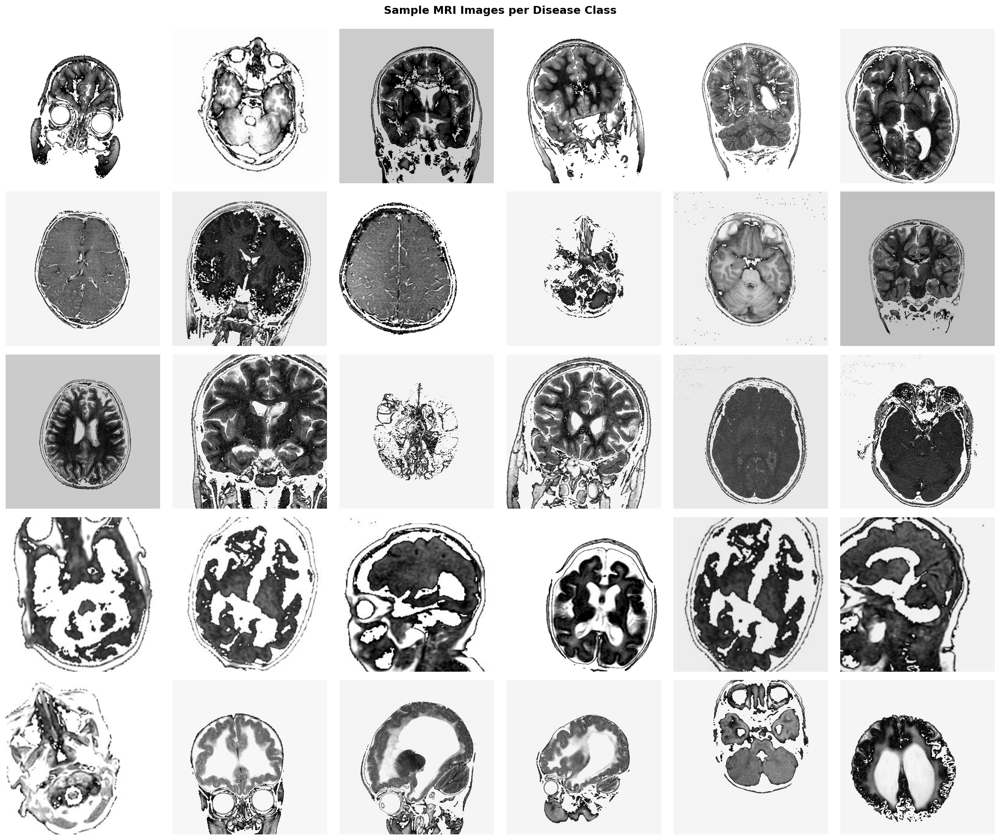

### Draw 2 — from notebook 02

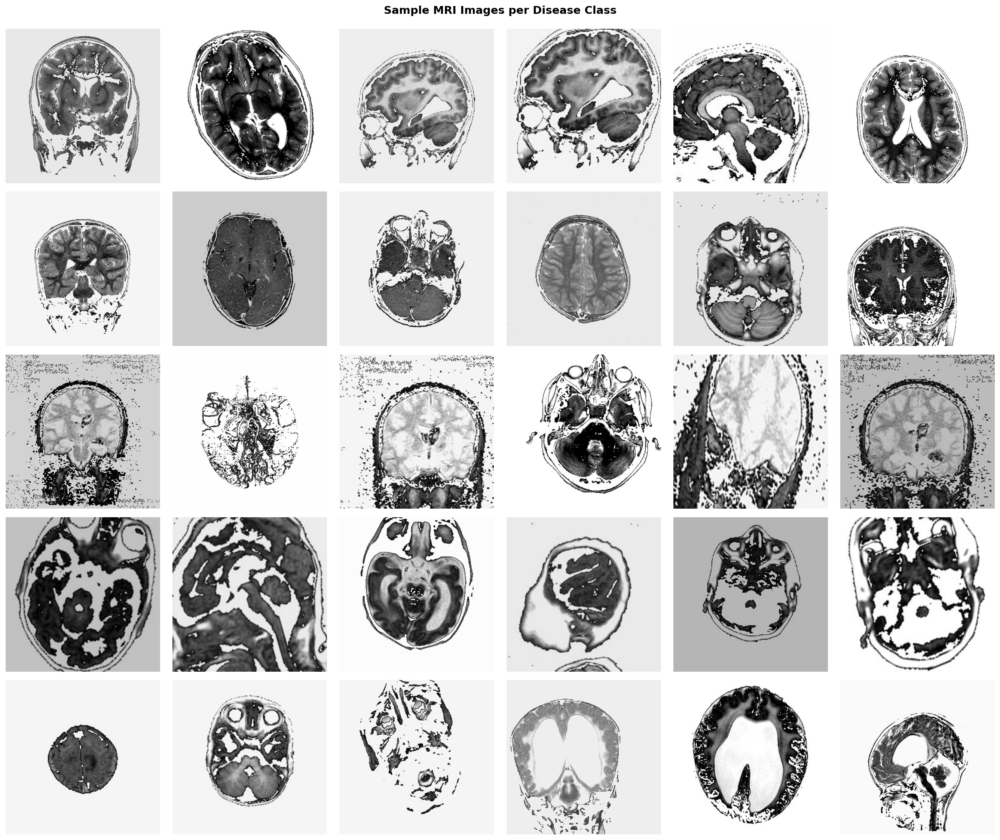

In [ ]:
display(Markdown("### Draw 1 — from notebook 01"))
show(RESNET_FIGS / "sample_grid.png", width=850)

display(Markdown("### Draw 2 — from notebook 02"))
show(CONVNEXT_FIGS / "sample_grid.png", width=850)

> #### *What both draws show*
>
> **Heterogeneity within each class:**
> - **Acquisition planes are mixed** — axial, coronal and sagittal appear side by side inside the same class, and several tiles are orbital or skull-base sections rather than brain slices
> - **Head sizes range from paediatric to adult**, consistent with conditions that present at very different ages
> - The images are **not raw DICOM**: they have been window-levelled and heavily contrast-stretched, producing saturated black and white regions, posterised grey levels and speckled skull outlines (*the original high-precision numerical data provided by the medical scanner are missing*)
> - Tiles are square-resized, so several appear stretched

> The rows differ not only in anatomy but in **rendering**. In both independent draws:
>
> - *moyamoya* shows a characteristic **salt-and-pepper speckle** across the image background
> - *pachygyria* is posterised into near-binary black and white
> - *hallervorden-spatz* is comparatively flat and mid-grey
> - even the padding colour varies between classes, from white to mid-grey

> *Consequence*
>
> These classes are distinguished not only by their clinical content, but also by **how the images were processed**. \
> As a result, a classifier can exploit global intensity statistics **without learning genuine pathological features**. While this affects both strategies equally — preserving the validity of the relative comparison at the core of this project — it means that the **absolute metrics reflect dataset separability** rather *than true diagnostic performance*


---

## **4) Strategy 1 — ResNet-50 as a frozen feature extractor + linear SVM**

### 4.1 *ResNet-50*

ResNet-50 *(He et al., 2015)* is a **50-layer convolutional network** built from **residual blocks** \
Each
block computes `y = F(x) + x`: the identity shortcut lets the gradient bypass the non-linear path, which is what made networks of this depth trainable in the first place \
Pre-trained on `ImageNet` *(1.28 M images, 1 000 classes)*, its convolutional stack has learned a general hierarchy of visual features —
edges and textures in the early layers, increasingly abstract shapes deeper in.

### 4.2 *How it was used here*

The network is used as a **fixed feature extractor**, not as a classifier:

```python
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
model.fc = nn.Identity()      # remove the 1000-class head
```

Replacing the final fully-connected layer with `nn.Identity()` exposes the output of **global average pooling:** each image becomes a **2048-dimensional vector** \
**No weight is ever updated and no label is ever seen by the backbone**

### 4.3 *SVM on top*

Three reasons, in order of weight:

1. **Methodological differentiation:** \
   The reference notebook on this dataset *fine-tunes ResNet-50
   end-to-end* and reports *97.14 %* (reproducing that would add little) \
   Using the same backbone in a *fundamentally different regime* — frozen, with a classical classifier — produces a **genuine comparison** rather than a replication
2. **It is the right tool for this input** \
   With *1 400* training samples in *2 048* dimensions, the problem is **high-dimensional** and **small-sample**: precisely where a *maximum-margin linear classifier* is well-behaved and a large neural head would overfit \
   The **SVM optimises** a convex objective, has a single hyperparameter, and is fitted in seconds
3. **Calibrated probabilities.** Fitted with `probability=True`, the SVM applies Platt scaling and exposes `predict_proba` — (*reliability/probability percentage*)

> *C* controls the **trade-off** between *margin width* and *training violations:* \
> - small *C* gives a **wide margi**n tolerating misclassifications,
>
> - large *C* forces a **tighter fit**
>
> It is tuned on the **validation** set, never on test, and ties are broken towards the **smallest** *C* — the *widest margin* among equally performing models

### 4.4 *Pipeline executed*

1. Extract *2048-D* features from the **deterministic** training split, plus validation and test
2. Tune *C* on validation over `{0.01, 0.1, 1, 10, 100}`
3. Refit on **train + validation** (1 700 samples) with `probability=True`
4. Evaluate **once** on the held-out test set

### 4.5 *What the embedding space looks like: PCA and LDA*

Two projections answering **different questions**

The contrast between them is more informative than either alone.

### PCA — unsupervised: maximises variance, ignores the labels

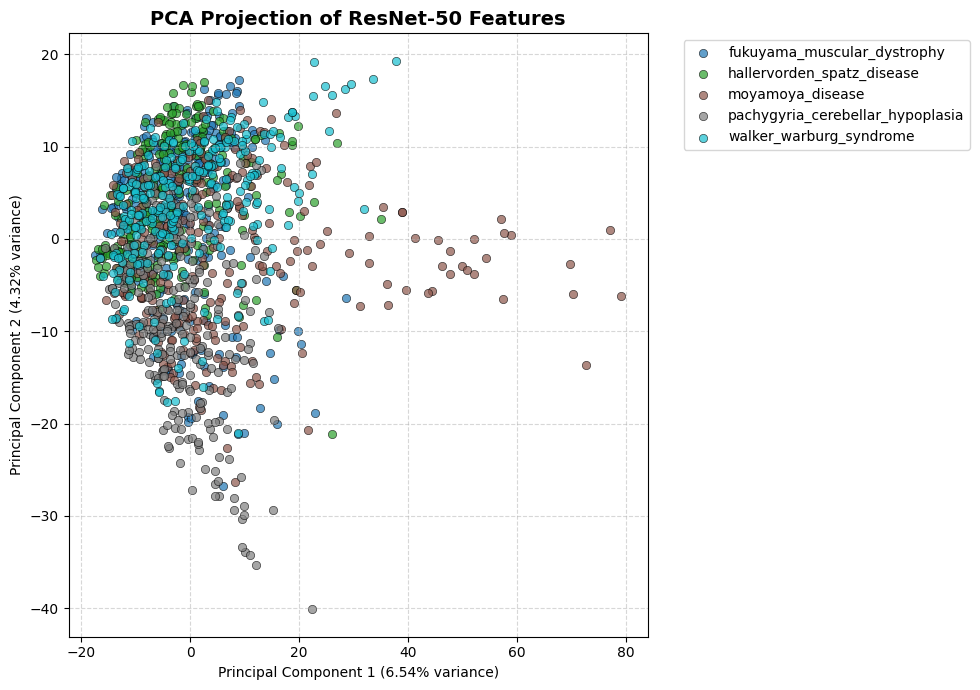

In [ ]:
display(Markdown("### PCA — unsupervised: maximises variance, ignores the labels"))

# The PCA cell of notebook 01 displays the figure without saving it. To include it here, add
#     plt.savefig(UTILS_DIR / "pca_projection_resnet50.png", dpi=150, bbox_inches="tight")
# to that cell and re-run it (a few seconds, the features are cached as .npy).
show(RESNET_FIGS / "pca_projection_resnet50.png", width=760)

#### *PCA — what it shows, and what it does not*

**PC1 + PC2 explain only 6.54 % + 4.32 % = 10.86 % of the variance**, and the *1 400* training embeddings form essentially **one dense overlapping cloud** with no visually separable clusters

This is a *negative* but informative result: in the frozen ImageNet embedding, **the dominant directions of variance are not related to the diseases** \
ImageNet contains no brain MRI, so nothing organised this space around these five conditions: most of the variance in MRI slices encodes nuisance factors: acquisition plane, brightness, head size.

**Separability cannot be shown with PCA:** it is unsupervised, so overlap in this projection is weak evidence. *Nearly 89 % of the information lives in the discarded directions.*

> *Note:* Two class-associated tails are visible
> - a long spread along PC1 populated almost entirely by *moyamoya*, and
> - a downward tail on PC2 by *pachygyria*
>
> The single largest direction of variance is therefore *partly* class-correlated, and read together with the sample grid — *where those
two classes carry the most distinctive rendering* — PC1 is plausibly a brightness/contrast axis.
>
> *This is the first quantitative hint of the preprocessing shortcut discussed in Section 3.1*

### LDA — supervised: maximises class separation

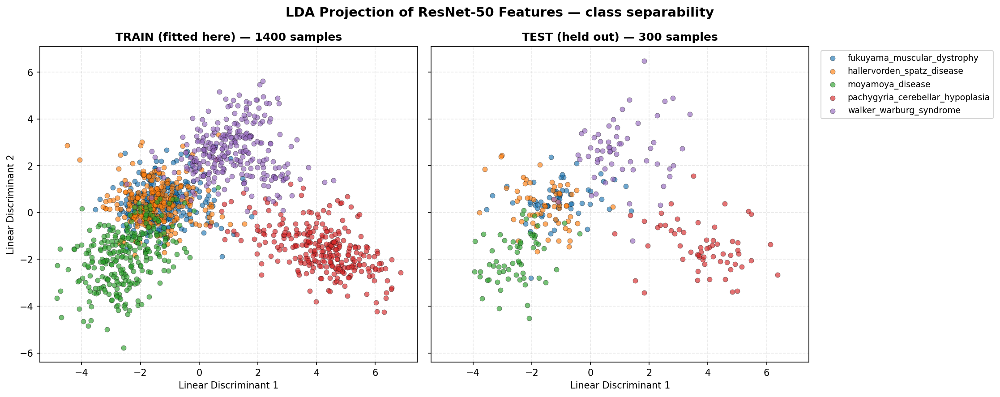

In [ ]:
display(Markdown("### LDA — supervised: maximises class separation"))
show(RESNET_FIGS / "lda_projection_resnet50.png", width=980)

#### *LDA — complementary to PCA*

LDA finds the directions maximising **between-class** scatter relative to **within-class** scatter \
With five classes it yields at most four discriminant directions; the first two are plotted.

*Two precautions to keep the plot honest:*

1. **PCA pre-reduction (50 components):** Prevents severe LDA overfitting \
  Without PCA, having *2 048* features for *1 400* samples creates fake, perfectly separated clusters even on pure noise (*0.95 train vs 0.24 test accuracy*) - **PCA removes this artifact**

2. **Train vs Test evaluation:** Because LDA is supervised, training plots naturally look artificially clean \
   *Only the held-out panel is evidence*



#### *Results*

| | value |
|---|---|
| PCA(50) retains | 52.7 % of the variance |
| LD1 + LD2 carry | 77.2 % of the **between-class** variance |
| LDA accuracy | train **0.9014**, test **0.8833** |
| Separation (between/within) | train **4.17**, test **3.94** |

**The projection is trustworthy** The train–test gap is **1.8 points**, and the separation drops by only **5.5 %**; proving the separation is real, unlike the random-label control (where the gap *was* the entire signal)

**The plot shows:**
- **Clean clusters:** *Moyamoya*, *Pachygyria*, and *Walker-Warburg* separate well
- **Heavy overlap:** *Fukuyama* and *Hallervorden-Spatz* blend in the center, making them the only difficult pair for a linear boundary

> **This resolves the PCA paradox** \
> The classes are **separable**, but along class-discriminative directions (LDA) rather than maximum variance (PCA). This explains how a linear SVM reaches *98.67%* accuracy even when **PCA looks like an unstructured cloud**

*About the lower bound*, LDA achieves *88.33%* accuracy compared to SVM's *98.67%*, meaning this visual plot shows a conservative **baseline of class separability**, not its upper limit

### 4.6 *Results*

### Confusion matrix — ResNet-50 + SVM

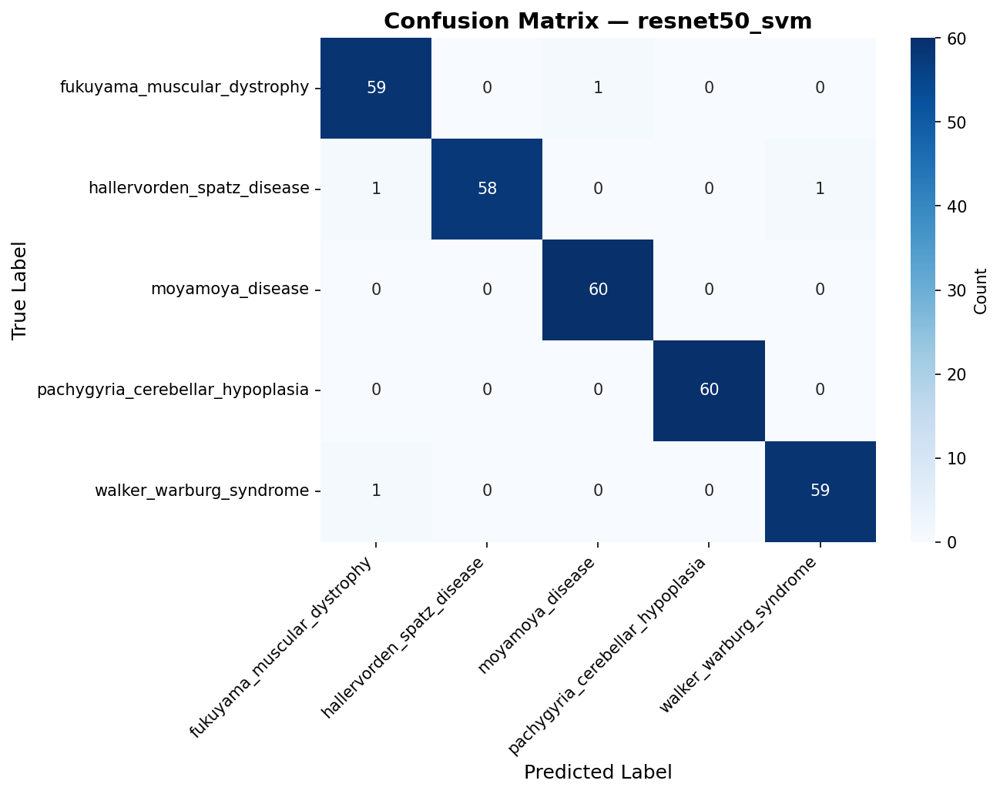

In [ ]:
display(Markdown("### Confusion matrix — ResNet-50 + SVM"))
show(RESNET_FIGS / "confmat_resnet50_svm.png", width=680)

#### *Confusion Matrix*

**Test accuracy 0.9867** (296/300, 4 errors); macro-F1 and weighted-F1 identical, as the balanced test set implies \
With 300 images the **95% confidence interval is roughly [96.6 %, 99.5 %]** — the point estimate should never be quoted alone

**The four errors, in full:**
- *fukuyama* → 1 predicted as *moyamoya*
- *hallervorden-spatz* → 1 as *fukuyama*, 1 as *walker-warburg*
- *walker-warburg* → 1 as *fukuyama*

The *fukuyama ↔ walker-warburg* confusion is the **clinically plausible** one: both are **congenital muscular dystrophies** with cobblestone lissencephaly and overlapping MRI appearance \
With only four errors, however, which specific pairs get confused would very likely *change with a different seed*

> *Note on the hyperparameter search:* the validation grid came out **completely flat**
>
> All tested values of C yielded *98.67%* accuracy, proving the **embedding space is already linearly separable**; `best_C = 0.01` was simply an **arbitrary tie-breaker**, not a tuned optimum
>
>

*The Calibration is **slightly Under-confident:*** Average model confidence (*96.88%*) is slightly below true accuracy (*98.67%*), showing healthy, conservative Platt scaling.

### Few-shot robustness — ResNet-50 + SVM

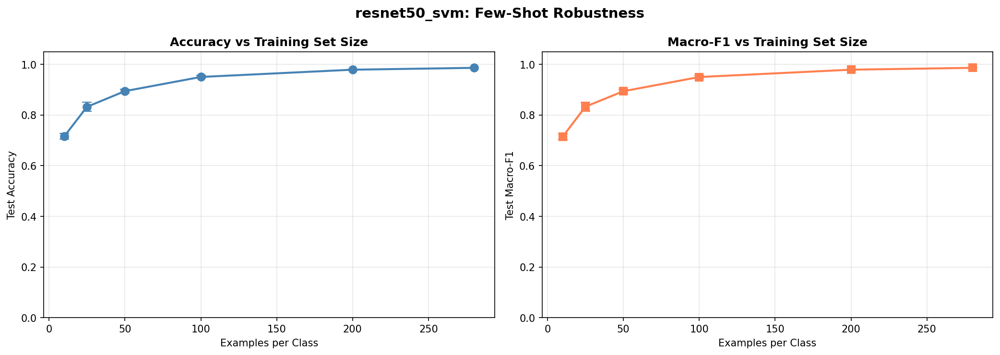

In [ ]:
display(Markdown("### Few-shot robustness — ResNet-50 + SVM"))
show(RESNET_FIGS / "fewshot_resnet50_svm.png", width=980)

### 4.7 *Why the few-shot analysis*

It simulates real-world rare disease scenarios by evaluating *how model performance degrades as training data shrinks*

- It was **trained on {10, 25, 50, 100, 200}** examples per class across *5 random balanced draws*, each using a **fresh SVM** and scaler evaluated on the full test set

- Because the **backbone features are frozen** and **label-independent**, shrinking the dataset strictly measures *data scarcity* without changing feature representations

| examples/class | accuracy | std | macro-F1 |
|---|---|---|---|
| 10 | **0.7160** | 0.0110 | 0.7148 |
| 25 | 0.8327 | 0.0181 | 0.8333 |
| 50 | 0.8947 | 0.0081 | 0.8943 |
| 100 | 0.9507 | 0.0057 | 0.9504 |
| 200 | 0.9793 | 0.0025 | 0.9794 |
| 280 (full) | 0.9867 | — | 0.9867 |


*Main points:*

- **Logarithmic curve:** Accuracy scales rapidly up to *100* examples/class, then plateaus (gaining only *+0.7%* between *200* and *280*)

- **Strong few-shot baseline:** Reaches *71.6%* accuracy with just *10* images per class (versus a *20%* random baseline)

- **Stabilizing variance:** Error variance drops sharply as sample size grows, reducing sensitivity to specific image draws

> *Full dataset point (x = 280)* \
> Derived from a single, unrepeated run trained on train + validation data (~340/class), making it **slightly optimistic** relative to the rest of the curve

---

## **5) Strategy 2 — ConvNeXt-Tiny, lightweight fine-tuning**

### 5.1 *ConvNeXt-Tiny*

ConvNeXt (*Liu et al., 2022*) is a convolutional network **redesigned in the light of Vision Transformers** - The authors took a ResNet and **modernised it** step by step, keeping only the changes that helped \
The result is a **pure CNN matching transformer accuracy without attention**

| | ResNet-50 (2015) | ConvNeXt-Tiny (2022) |
|---|---|---|
| Parameters | 25.6 M | 27.8 M |
| Convolution | 3×3 standard | **7×7 depthwise** — larger receptive field, fewer FLOPs |
| Block shape | bottleneck (wide → narrow → wide) | **inverted** (narrow → wide → narrow), as in transformers |
| Normalisation | BatchNorm, after every conv | **LayerNorm**, one per block |
| Activation | ReLU, after every conv | **GELU**, one per block |
| Downsampling | inside the residual block | **separate layers** |
| ImageNet top-1 | 76.1 % | **82.1 %** |

> *Why it was chosed*
>
> 1. **Higher Baseline Performance:** Delivers a *+6%* ImageNet top-1 accuracy boost over ResNet-50 at a similar parameter count, offering **stronger pre-trained representations**
>
> 2. **Controlled Comparison:** Matches ResNet-50 in size and architecture family, ensuring performance differences stem from the training strategy (*frozen vs. fine-tuned*) rather than model capacity
>
> 3. **Larger Receptive Field:** Uses *7x7 depthwise convolutions* to capture broader spatial context—ideal for detecting diffuse structural abnormalities rather than localized lesions

---

### 5.2 *Lightweight fine-tuning: what is frozen and why*

```python
# Freeze backbone and classifier LayerNorm
for p in model.features.parameters(): p.requires_grad = False
for p in model.classifier[0].parameters(): p.requires_grad = False

# Unfreeze final stage and attach new 5-class head
for p in model.features[7].parameters(): p.requires_grad = True
model.classifier[2] = nn.Linear(768, 5)
```

*Rationale*

- **Preserve general features:** Early layers capture *low-level patterns* (edges, textures) that transfer directly across domains

- **Adapt task-specific representations:** Later layers store *high-level abstractions* that must be re-learned for MRI data

- **Prevent overfitting:** Freezing early stages *preserves pre-trained weights* and reduces parameter drift when training on *1 400* images


*Understanding the "Lightweight" Parameter Count*

    Trainable parameters: 14,293,253 / 27,823,973  (51.4 %)

The reason behind the high *51.4%* is architectural: ConvNeXt is **heavily back-loaded**, and its last stage — three blocks at *768 channels* — holds roughly half the network's weights on its own \
So *"last stage + head"* is a **small number of *modules*** but **half** the
*parameters*.

**Heavy regularization is required:** Operating at a *~10,000:1* parameter-to-sample ratio (*14.3M parameters vs. 1,400 images*) makes data augmentation and weight decay **indispensable**

---

### 5.3 *Training configuration*

| | choice | rationale |
|---|---|---|
| Optimiser | **AdamW**, lr 1e-4 | decoupled weight decay; given only the parameters with `requires_grad=True`, so frozen stages carry no optimiser state |
| Weight decay | 1e-2 | regularisation, necessary at this parameter-to-sample ratio |
| Scheduler | **cosine annealing**, T_max = 15 | smooth decay to ~0, no step tuning |
| Loss | cross-entropy | standard for a balanced 5-way problem |
| Epochs | 15 | |
| Checkpoint | **best validation loss** | loss is finer-grained than accuracy and saturates less easily |

*Training run output*

- **Rapid convergence:** Validation accuracy reaches *96.33%* at *epoch 1*

- **Early saturation:** Validation accuracy reaches *100%* (*300/300*) by *epoch 9* and remains perfect through *epoch 15*

- **No overfitting signal**: training loss falls to 0.0080 and validation loss falls with it

- **Best checkpoint:** Saved at *epoch 11* with a validation loss of *0.0012*

> *Validation Ceiling & Checkpointing Rationale*
>
> - **Accuracy saturation:** From *epoch 9* onward, validation accuracy reaches a ceiling, making **validation loss** the only *viable checkpointing metric*
>
> - **Minor loss noise:** Small loss variations (*0.0012 vs. 0.0022*) across *epochs 9-15* represent **minor noise** on a *300-image* validation set rather than meaningful performance differences
>
> - **Arbitrary selection:** Choosing *epoch 11* over any other checkpoint between *epochs 9* and *15* is effectively **arbitrary**, reflecting a **lack of validation** headroom rather than a flaw in the procedure


### 5.4 *What fine-tuning did to the feature space*

### PCA of the fine-tuned 768-D embedding

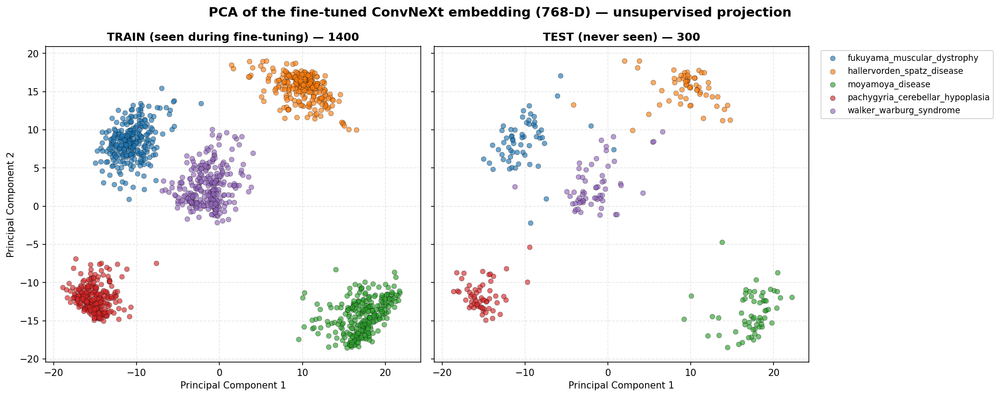

In [ ]:
display(Markdown("### PCA of the fine-tuned 768-D embedding"))
show(CONVNEXT_FIGS / "pca_embedding_convnext.png", width=980)

#### *PCA, not LDA*

*The roles of the two projections **swap** between the notebooks*

> In *notebook 01* the backbone is frozen and label-independent, so LDA adds real information: it finds the discriminative directions PCA hides

Here the network was **trained on these labels** — separating the classes is *what the last stage was optimised to do*

*Stacking LDA on top would make it impossible to tell whether clean clusters come from the network or from the projection*

**PCA answers directly:** if an *unsupervised* projection already separates the classes, the fine-tuning is what put them there \
The LDA figures are computed anyway, so the claim can be checked

---
#### *Results*

| | ResNet-50 (frozen) | ConvNeXt (fine-tuned) |
|---|---|---|
| PC1 + PC2 variance | 10.86 % | **37.88 %** |
| PCA separation (test) | — | **21.45** |
| LDA separation (test) | 3.94 | **56.95** |


- **Class Alignment:** PC1 + PC2 variance rise from *10.86%* to *37.88%*, demonstrating that fine-tuning aligns the dominant variance directions with *class structure* rather than nuisance factors

- **Distinct Clustering:** Both PCA and LDA show five clean, well-separated clusters for the fine-tuned model, whereas frozen features failed to separate them \
  **The fine-tuned embedding, projected *without* using the labels, separates about 5× better (21.45) than the frozen one projected *with* them (3.94)**

*Measured with the same supervised projection, the improvement is roughly **14×** (56.95 vs 3.94)*

---

### The train → test drop

Separation falls **33.89 → 21.45** on PCA and **90.25 → 56.95** on LDA - a consistent **−37 %** \
*In notebook 01 the same drop was **−5.5 %***

*The frozen backbone treats train and test alike because it never saw either; the fine-tuned network has partly memorised its training images*


> *Why LDA Still Improves on Fine-Tuned Features*
>
> - **Substantial Boost:** LDA improved test separation by *+166%* over PCA
>
> - **Variance Distribution:** Because PC1 + PC2 capture only *37.88%* of total variance, a significant portion of the class structure resides in **lower-variance dimensions** that LDA explicitly targets

### 5.5 *Results*

### Confusion matrix — ConvNeXt-Tiny fine-tuned

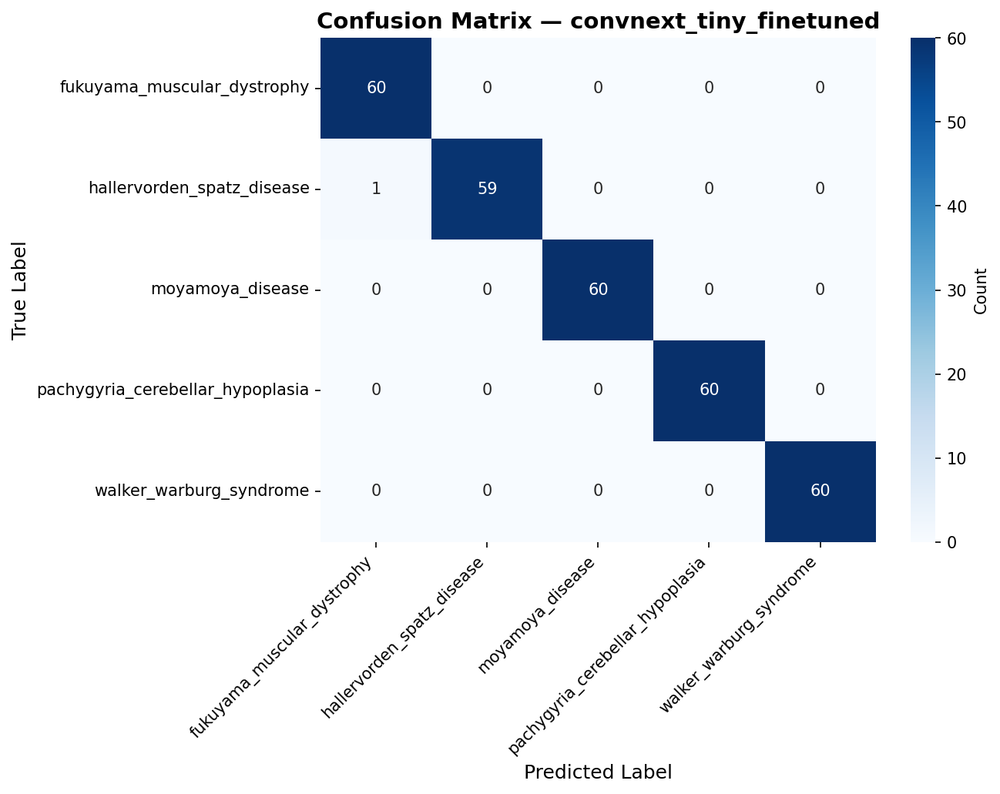

In [ ]:
display(Markdown("### Confusion matrix — ConvNeXt-Tiny fine-tuned"))
show(CONVNEXT_FIGS / "confmat_convnext_tiny_finetuned.png", width=680)

#### *Confusion matrix*

> - **Test Accuracy:** *99.67%* (*299/300*, *1 error*)
>
> - **Macro-F1:** *0.9967*
>
> - **Test Loss:** *0.0106*
>
> - *95%* **Confidence Interval:** ~[98.1%, 99.9%]


**Four out of five** classes achieved perfect accuracy (*60/60*) \
The sole error across the entire test set was one *Hallervorden-Spatz* slice predicted as *Fukuyama*

> *The fact that two distinct architectures, training regimes, and classifiers failed on the same image strongly suggests an atypical slice, anatomical ambiguity, or a source dataset labeling error*

*Test Set Saturation*

- **Resolution Ceiling:** Flawless scores across multiple classes reflect **test set saturation** rather *than unbounded model capability*

- **Statistical Limitation:** With *60 test images* per class, a perfect score simply bounds the error rate below *~1.6%* (*1/60*) \
The **test set lacks** the statistical resolution to differentiate a highly performant model from a truly flawless one

### Few-shot robustness — ConvNeXt-Tiny (true re-fine-tuning)

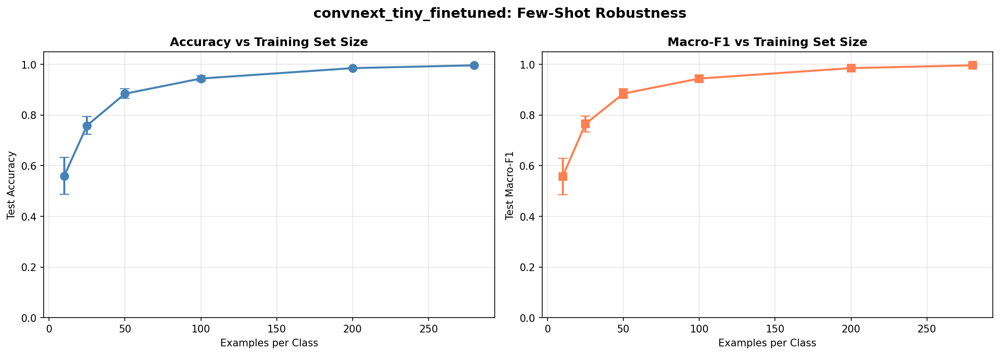

In [ ]:
display(Markdown("### Few-shot robustness — ConvNeXt-Tiny (true re-fine-tuning)"))
show(CONVNEXT_FIGS / "fewshot_convnext_tiny_finetuned.png", width=980)

#### *Preventing Data Leakage in Few-Shot Evaluation*


*The Initial Flaw (Data Leakage)*

- **Invalid shortcut:** The original approach extracted features from a backbone already fine-tuned on the full dataset, then retrained a linear head on smaller subsets

- **Spurious results:** Because the backbone had already seen all training labels, full-dataset supervision leaked into every subset \
This produced an artificially flat *~99.6%* accuracy curve across all sample sizes, failing to simulate true data scarcity.


The correct protocol re-measures it honestly. For each subset size, and for each of 3 repetitions:

1. draw a class-balanced subset of **distinct** training images
2. **re-initialise ConvNeXt-Tiny from ImageNet weights**
3. **fine-tune on that subset** only, same freezing scheme and hyperparameters
4. **evaluate** on the **untouched** test set

That is **15 complete fine-tuning runs**, the *longest computation in the project*

| examples/class | accuracy | std |
|---|---|---|
| 10 | **0.5600** | 0.0731 |
| 25 | 0.7589 | 0.0350 |
| 50 | 0.8844 | 0.0191 |
| 100 | 0.9444 | 0.0103 |
| 200 | 0.9856 | 0.0016 |
| 280 (full) | 0.9967 | — |

*Replacing feature-reuse with true end-to-end re-fine-tuning eliminated target leakage, transforming a meaningless flat artifact into the repository's core methodological finding*


---

## **6) Comparison and model selection**

### 6.1 *Head-to-Head Results*

| examples/class | ResNet-50 + SVM | ConvNeXt-Tiny FT | difference |
|---|---|---|---|
| 10 | **0.7160 ± 0.0110** | 0.5600 ± 0.0731 | **+15.6 pp** to the frozen backbone |
| 25 | **0.8327 ± 0.0181** | 0.7589 ± 0.0350 | +7.4 pp |
| 50 | **0.8947 ± 0.0081** | 0.8844 ± 0.0191 | +1.0 pp |
| 100 | **0.9507 ± 0.0057** | 0.9444 ± 0.0103 | +0.6 pp |
| 200 | 0.9793 ± 0.0025 | **0.9856 ± 0.0016** | −0.6 pp |
| 280 (full) | 0.9867 | **0.9967** | −1.0 pp |

**The two strategies cross over at roughly *50–100* examples per class**

- **Low-data regime** (< 50/class): The frozen backbone wins decisively (+15.6 pp at $n=10$) \
  Fitting a linear hyperplane in a fixed feature space degrades gracefully, whereas fine-tuning struggles to constrain *14.3M* parameters with only *50 total images*

- **High-data regime** (>100/class): Fine-tuning takes the lead, though by small margins (< 1.0 pp) \
  
- **Variance gap:**  At $n=10$, ConvNeXt's standard deviation is ~7x higher (0.0731 vs. 0.0110) \
  In low-data scenarios, fine-tuning is not only less accurate but highly unstable

For **rare disease applications with minimal annotated samples**, classical feature extraction on a frozen backbone is superior in *accuracy, stability,* and *training efficiency*

---

### 6.2 *Fixed Epochs vs Optimizer Steps*

Setting `FEWSHOT_EPOCHS = 8` fixes total epochs rather than total gradient updates \
At batch size *32*:

| n per class | images | optimiser steps in 8 epochs |
|---|---|---|
| 10 | 50 | **16** |
| 200 | 1 000 | **256** |


This **16× step disparity** leaves the smallest subsets *potentially under-trained* rather than strictly data-starved, biasing performance toward the frozen backbone at small $n$

While the **7× variance gap** independently confirms *fine-tuning instability*.

---

### 6.3 *Full-Dataset Statistical Equivalence*

On the full test set (*300 images*), **ConvNeXt** achieves *0.9967* (299/300) versus **ResNet + SVM's** *0.9867* (296/300) — *a difference of only 3 images*

*McNemar's* test on paired disagreements yields $p \ge 0.25$, indicating **no statistically significant difference** \
On full data, both models **perform identically**; the meaningful performance divide exists strictly in the *few-shot regime*

### 6.4 *API Deployment Model Selection*

| criterion | ResNet + SVM | ConvNeXt | Decisive driver |
|---|---|---|---|
| Full-data accuracy | 0.9867 | 0.9967 | **no** — 3 images, *p* ≥ 0.25 |
| Few-shot robustness | **much better** | worse | **no** (API uses full 1,400 samples) |
| Probability calibration | Platt-scaled | ECE 0.0048 | no — both well calibrated |
| Grad-CAM | **impossible** | available | **yes** |
| Embedding separability (test) | 3.94 | **56.95** | **yes** |
| Deployment artifact | backbone + scaler + sklearn pickle | single `.pth` | **yes** |


- **Grad-CAM Explainability (Decisive):** An explainability endpoint is mandatory \
  Because the SVM *operates on features extracted outside* the computational graph, gradient attribution is **impossible** \
  The end-to-end network *supports Grad-CAM natively*

- **Representation Quality:** A *14× wider class separation margin* ensures more predictable behavior on ambiguous or borderline inputs

- **Pipeline Simplicity:** The network deploys as a *single* `.pth` file, *avoiding multi-artifact pipelines and version-fragile scikit-learn pickles*

> #### *Pros and cons summary*
>
> **ResNet-50 + SVM**
>
> - *Pros:* **Highly robust** and **7× more stable in low-data regimes**; zero trainable parameters; fits in seconds; natively calibrated; transparent and easy to audit
>
> - *Cons:* **Lacks gradient-based explainability** (`Grad-CAM`); weaker embedding separation; requires multi-file deployment artifacts (pickle dependency); slightly lower full-data accuracy
>
> **ConvNeXt-Tiny (Fine-Tuned)**
>
> - *Pros:* **Highest full-data accuracy** (*0.9967*); **14× superior embedding** separation; native Grad-CAM support; single deployment artifact (.pth); highly calibrated softmax (*ECE 0.0048*)
>
> - *Cons:* **Unstable** and **inaccurate with scarce data**; *14.3M* trainable parameters; requires GPU training; computationally expensive evaluation protocol.

**→ Deployment Selection: *ConvNeXt-Tiny (Fine-Tuned)***

---

## **7) From the notebook to the API**

### 7.1 *Artifact Decoupling and Deployment Bundle*

The deployment bundle is deliberately **split into two distinct files** to *minimize container overhead* and *prevent runtime failures*:


- **`convnext_tiny_finetuned_weights.pth`** (*~110 MB*): The model `state_dict`
  - The API reconstructs the **base architecture** (`convnext_tiny(weights=None)`),
  - **modifies the head** (`nn.Linear(768, 5)`), and
  - **loads the trained weights**

- **`convnext_tiny_deploy.pkl`** (*258 B*): \
  Lightweight metadata dictionary holding required runtime configurations:

```python
{'class_names': [...],            # the label mapping
 'img_size': 224,
 'confidence_threshold': 0.99898, # rejection rule
 'test_accuracy': 0.9967,
 'ece': 0.0048}
```

*Architectural Decisions:*

- **Dependency Minimization:** \
  The full development artifact (`artifacts.pkl`) contained a `pandas.DataFrame` from *few-shot benchmarking* \
  Extracting a lightweight deployment pickle removes `pandas` and `scikit-learn` from container runtime requirements, *drastically reducing image size* and *eliminating library version fragility*

- **Preventing Silent Label Permutations:** Raw network outputs are integer indices \
  Inferring label mappings **dynamically at runtime** (*as scanning directory structure*s) risks **permuting disease names** due to system-dependent sort orders \
  `app.py` strictly requires `class_names` inside `deploy.pkl` and halts startup if missing

---

### 7.2 *Deployment Guarantees Measured Prior to Serving*

*→ Guarantee 1: **Probability Calibration***

*Softmax outputs* represent **normalization** rather than true confidence; cross-entropy-trained CNNs are notoriously *over-confident*

| *Calibration metrics* | value |
|---|---|
| mean confidence | 0.9968 |
| actual accuracy | 0.9967 |
| **Expected Calibration Error (ECE)** | **0.0048** |


**Claimed confidence matches true accuracy** within *0.0001*, outperforming typical uncalibrated CNN baselines ($ECE$ ranges from *0.05 to 0.15*)

*Temperature scaling* was unviable because *100% validation accuracy* caused **optimization degeneracy**, so the naturally well-calibrated raw softmax was retained as-is

*→ Guarantee 2: **Out-of-Distribution (OOD) Input Rejection***

The model operates under a **closed-set assumption**, but real-world serving presents **open-set inputs* (*CT scans, photographs, healthy tissue*) that softmax forces into a **high-confidence prediction**

***Rejection Rule:*** Inputs with *softmax confidence* **below** the *5th percentile* of validation confidences (*0.9990 threshold*) are **rejected**

*Validation & Test Behavior:*

- **Validation Refusal:** *5.0%* (by design)

- **Test Refusal:** *6.7%* (*20/300* images rejected)

- **Accepted Test Accuracy:** *100.0%* on the *280* accepted test images (the single misclassified test image fell below the confidence threshold and was safely rejected)

- **Noise Robustness:** Pure random noise images yielded a mean confidence of *0.3494*, resulting in a *100%* **rejection rate**

> ***Alternative Method:*** Feature-space *Mahalanobis distance* was evaluated and yielded identical performance \
> However, it added *computational overhead* (storing and computing a $768 \times 768$ covariance matrix), so the *simpler confidence threshold* was retained


---

## **8) The API**

### 8.1 *FastAPI service*

A **FastAPI** service exposing the trained classifier over `HTTP` \
FastAPI was chosen because it derives **interactive OpenAPI documentation automatically** from Python type hints and *Pydantic models* — so the response schema is validated at runtime and documented without a separate specification

| Method | Endpoint | Returns |
|---|---|---|
| `GET` | `/health` | liveness probe (used by the Docker healthcheck) |
| `GET` | `/model-info` | architecture, device, classes, threshold, test accuracy, ECE |
| `GET` | `/classes` | the five classes with index and ORPHA code |
| `POST` | `/predict` | predicted disease, confidence, **full probability distribution**, in/out-of-distribution flag |
| `POST` | `/gradcam` | PNG with the Grad-CAM heatmap over the slice |

> *Where to connect*
>
> | Service | URL |
> |---|---|
> | *Main application* | **http://localhost:8000/** |
> | **Interactive documentation (Swagger UI)** | *http://localhost:8000/docs* |
> | Alternative documentation (ReDoc) | http://localhost:8000/redoc |
> | Raw OpenAPI schema | http://localhost:8000/openapi.json |

`/docs` is the practical entry point, from whitch **every endpoint** can be exercised from the browser with an upload button, which is also the quickest way to demonstrate the service.

> *Example response*
>
>```json
>{
>  "predicted_class": "moyamoya_disease",
>  "orpha_code": "ORPHA:2573",
>  "confidence": 0.9993,
>  "probabilities": [ ... all five, sorted descending ... ],
>  "in_distribution": true,
>  "confidence_threshold": 0.9990,
>  "warning": null,
>  "disclaimer": "Research demonstrator ... not for diagnostic use."
>}
>```

When `in_distribution` is `false` the response still contains the probabilities, but carries an explicit
warning that the **prediction is not meaningful** \
Returning `200` with a flag rather than an error leaves the decision to the caller and makes the behaviour visible instead of hidden

---

### 8.2 *Grad-CAM*

Built natively using PyTorch forward and backward hooks (`gradcam.py`, *~80 lines*) rather than external packages, **eliminating third-party dependencies** from the deployment container and keeping *target-layer selection explicit*

- **Target Layer & Attribution Pipeline:** Targets `model.features[-1]` (output shape $[B, 768, 7, 7]$) \
  Channel importance weights are derived from *spatially averaged gradients* of the target class logit \
  The weighted sum of feature maps is passed through a *ReLU*, upsampled to $224 \times 224$, and overlayed on the input MRI slice
- **ConvNeXt Compatibility:** Because ConvNeXt natively preserves standard 2D spatial layouts throughout its architecture, **no `reshape_transform` step** is required

---

### 8.3 *Preprocessing must match training exactly*

```python
T.Resize((224, 224)), T.ToTensor(),
T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
```

These are the `ImageNet` statistics used in `dataset.py`


---

## **9) Containerization & Deployment**

### 9.1 *Containerization Strategy & Docker*

The service must run identically on any machine \
The image pins Python 3.11, `torch==2.2.2` and `torchvision==0.17.2` from the **CPU-only wheel index** — the CUDA build would add several GB for no benefit, since inference on a single 224×224 image takes well under a second on CPU

**Design choices:**


- **Minimal Runtime Dependencies:** Container packages are strictly **limited to serving requirements** (`fastapi`, `uvicorn`, `pydantic`, `python-multipart`, `Pillow`, `numpy`) \
  Training-time dependencies (`torchio`, `SimpleITK`, `pandas`, `scikit-learn`, `matplotlib`, `kaggle`) are **completely excluded**

- **Security & Health Monitoring:** Executes under a dedicated *non-root user* (`appuser`, `UID 1000`) \
  Includes an **automated healthcheck** against `/health` (runs every `30s` with a *60s* `start_period` to accommodate model initialization)

- **Read-Only Local Mounting:** Local execution mounts the model store as *read-only* (`./models:/app/models:ro`), protecting weights from runtime mutation and enabling model updates without image rebuilds

---

### 9.2 *Local Orchestration via Docker Compose*

```bash
cd API_App
docker compose up --build
```

*Initial build requires 5–10 minutes to fetch PyTorch CPU wheels; subsequent builds leverage cached layers*

**`docker-compose.yml`** encapsulates *environment variables* (`MODEL_DIR`, `DEVICE`, `IMG_SIZE`, `MAX_UPLOAD_MB`, `ENABLE_REJECTION`), port bindings, volume mounts, restart policies, and healthchecks in a single configuration file

```
[startup] ConvNeXt-Tiny on cpu | classes=[...] | rejection=on
INFO:     Uvicorn running on http://0.0.0.0:8000
```

---

### 9.3 *Container Registry Deployment*

The production-ready image is published to the **GitHub Container Registry (GHCR):**

```bash
docker tag ghcr.io/rayoyo/rare-neuro-mri-api:2.1.0 ghcr.io/rayoyo/rare-neuro-mri-api:latest
docker push ghcr.io/rayoyo/rare-neuro-mri-api:latest
docker run -d -p 8000:8000 --name rare-neuro-mri-api ghcr.io/rayuser/rare-neuro-mri-api:2.0.0
```

Production builds bake model weights directly into the container filesystem (`COPY models/ /app/models/`) rather than relying on *volume mounts*, ensuring the **image runs independently** of host file structures


---
## **10) GUI walkthrough**

The web application provides an **interactive graphical interface** for inference, model explainability, system inspection, and API documentation, organized into five main navigation views

Firstly, It is possible to **classify an MRI image**

- Features a *drag-and-drop* area supporting `JPG` and `PNG` *axial brain MRI uploads*, with placeholders for **scan visualization** and **classification metrics**

- **Displays the uploaded MRI** alongside the **top predicted disease**, its *Orphanet (ORPHA) code*, *top-1 confidence score*, and a *color-coded* bar chart showing the **full 5-class probability distribution**

> Automatically triggers a **warning banner** when prediction confidence drops *below the $99.90\%$* threshold, alerting users that the scan may represent a healthy control, an alternative pathology, or an invalid modality

### Classify an MRI Image - no image selected

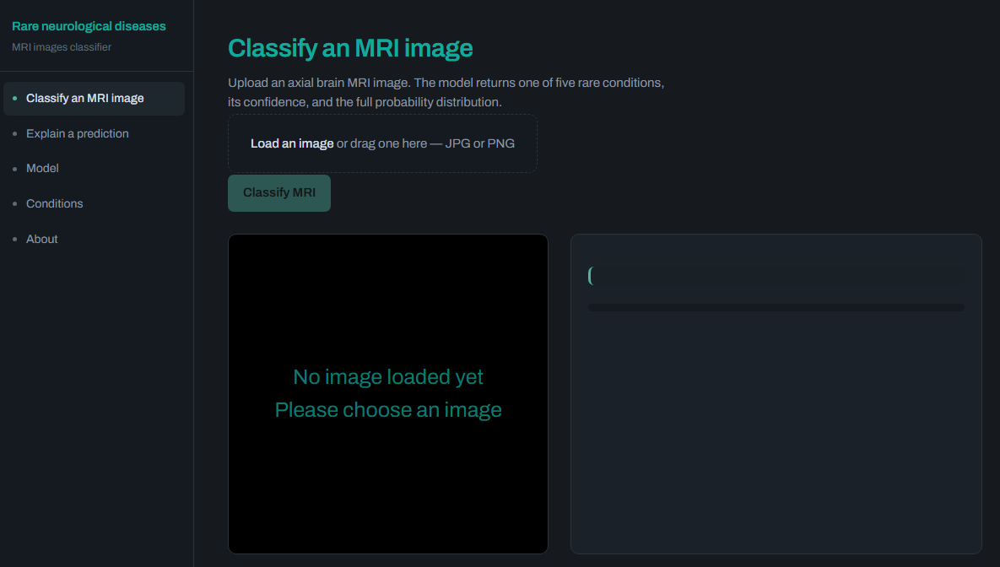

### Classify an MRI Image - with predictions

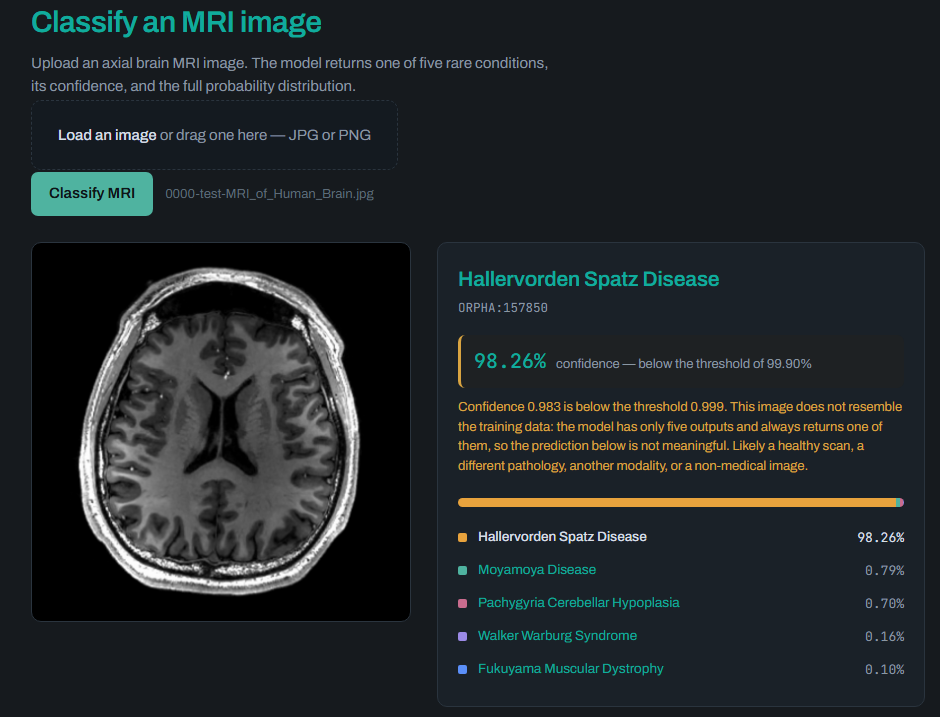

In [ ]:
display(Markdown("### Classify an MRI Image - no image selected"))
show(GUI_IMG / "00-MRI_eval_no_file.png", width=980)
display(Markdown("### Classify an MRI Image - with predictions"))
show(GUI_IMG / "00.1-MRI_eval.png", width=980)

Then, It is possible to see the **gradcam**:

- Still an image uploader, then a dropdown to target specific classes (defaulting to the predicted class), and a slider to **adjust Grad-CAM overlay opacity**

- Renders the raw input scan next to **its Grad-CAM** visual attribution map, using *warm highlights* to pinpoint the exact anatomical regions driving the network's output.

### GRAD-CAM visualization - no image loaded

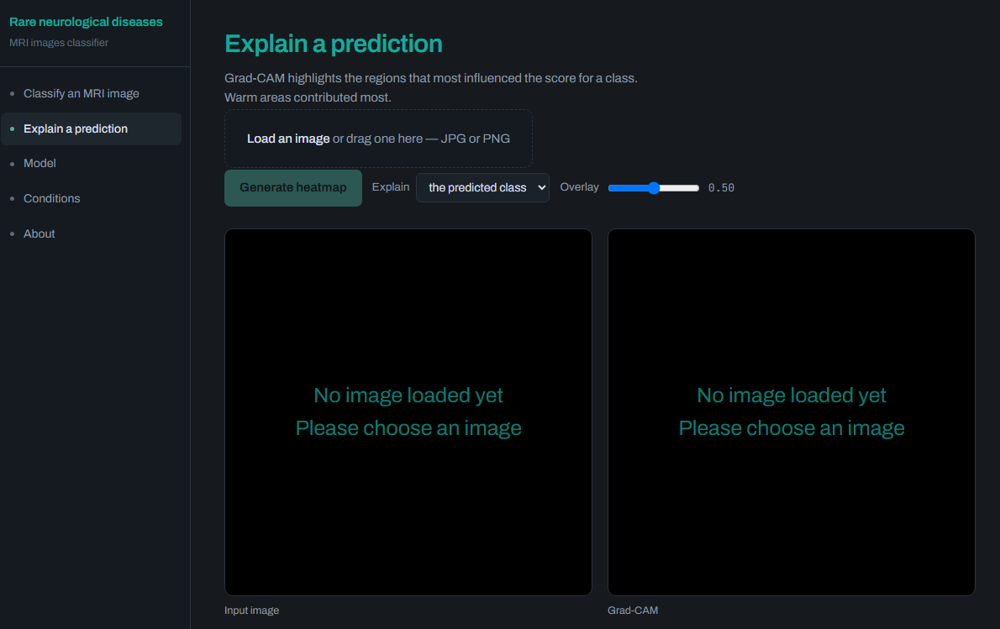

### GRAD-CAM visualization - with GRAD-CAM displayed

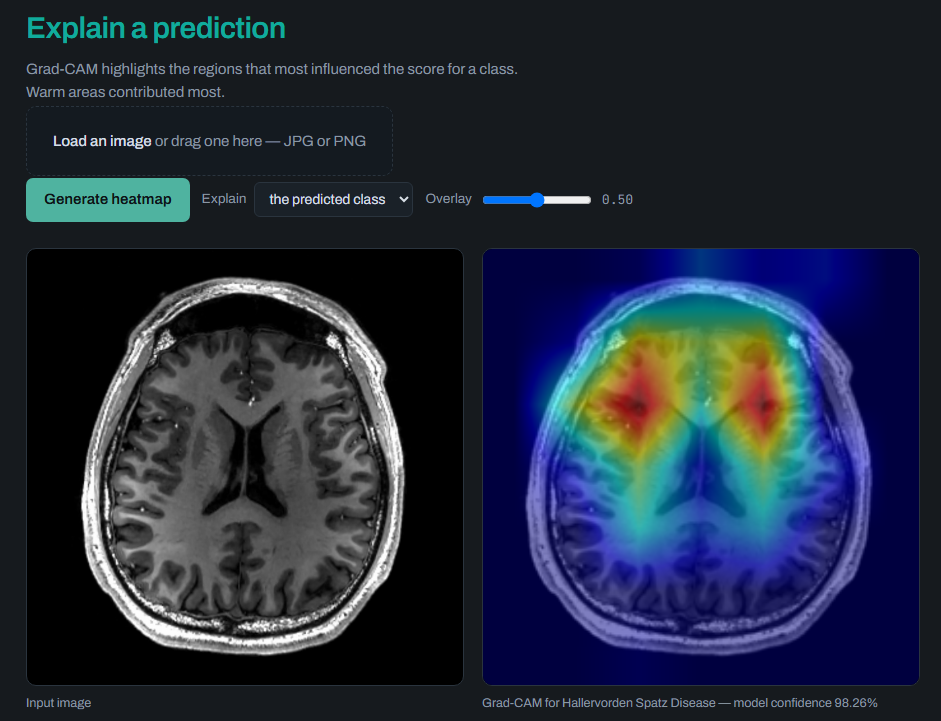

In [ ]:
display(Markdown("### GRAD-CAM visualization - no image loaded"))
show(GUI_IMG / "01-GRAD-CAM_no_file.png", width=980)
display(Markdown("### GRAD-CAM visualization - with GRAD-CAM displayed"))
show(GUI_IMG / "01.1-GRAD-CAM.png", width=980)

Another window shows the **model metadata**

### Model Metadata

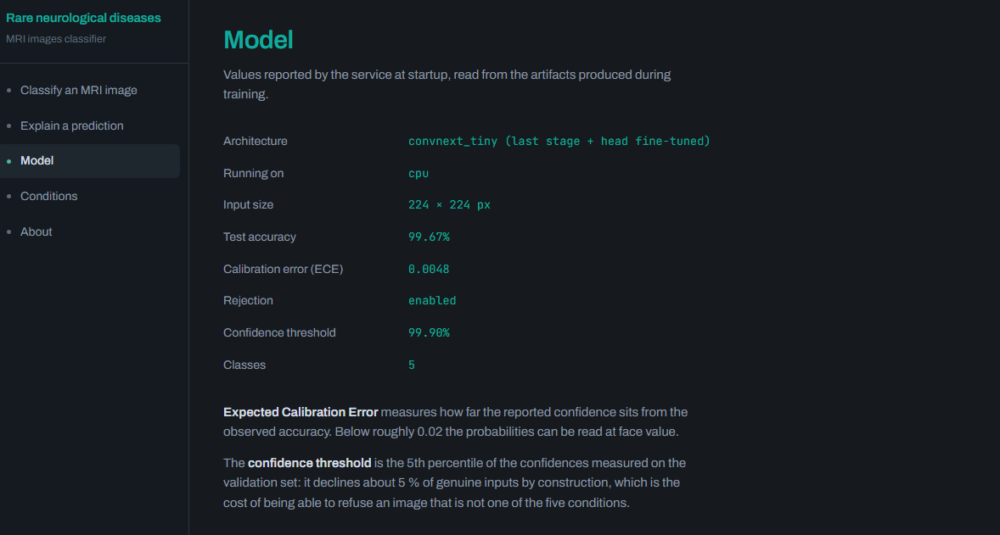

In [ ]:
display(Markdown("### Model Metadata"))
show(GUI_IMG / "02-Model.png", width=980)

In the *Conditions' window*, it is possible to see all the **disease** analyzed by the model along with their **descriptions**.

### Diseases

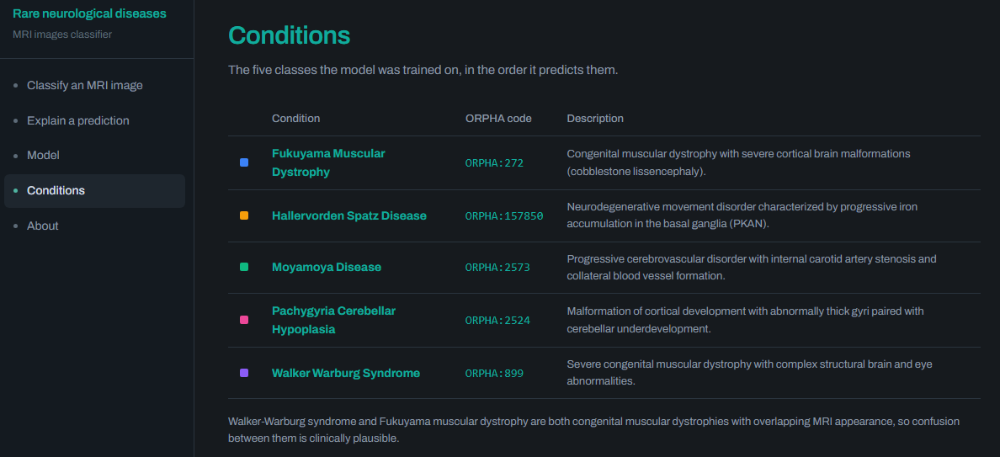

In [ ]:
display(Markdown("### Diseases"))
show(GUI_IMG / "03-Conditions.png", width=980)

Finally, a *small About section*.

### About section

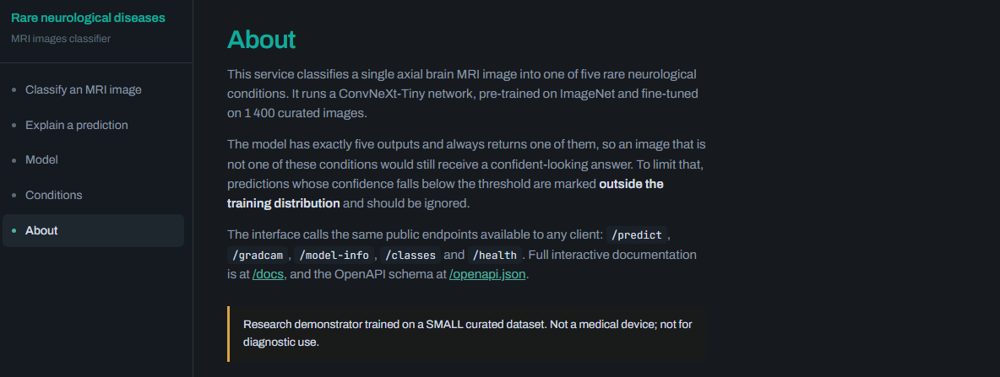

In [ ]:
display(Markdown("### About section"))
show(GUI_IMG / "04-About.png", width=980)

---

## **11) Conclusions, limitations and next steps**

### 11.1 *Key finding*


1. **With the full dataset the two strategies are equivalent**: 0.9967 vs 0.9867, three images, McNemar *p* ≥ 0.25

2. **Under scarcity they diverge sharply, in favour of the simpler method** \
  At 10 examples per class the frozen backbone is **15.6 points more accurate and 7× more stable** \
  *The crossover is around 50–100 examples per class*

3. **Fine-tuning restructures the feature space substantially** — 14× better class separation on held-out data — which is why it wins once data is sufficient

4. **The deployed model is ConvNeXt-Tiny**, chosen on explainability, representation quality and deployment robustness *rather than on a statistically insignificant accuracy difference*

---

## 11.2 *Methodological Limitations*

**Class-correlated preprocessing.** The five classes differ in rendering (background speckle, posterisation, padding) as well as in anatomy, confirmed on two independent sample draws \
  The figures measure **separability on this dataset as distributed**, not diagnostic performance

- **Test Set Saturation:** With *300* total test images (*1 error vs. 4 errors*) and multiple classes scoring a flat *1.000*, the test set lacks the statistical resolution to separate exceptional models from flawless ones \
  *Point estimates must always be reported alongside confidence intervals*

- **Patient-level grouping is unverifiable** \
  `metadata.csv` confirms no source file is reused across splits, but carries **no patient identifier**, and the split is random at image level \
  At these prevalences, *400* images per condition **cannot** come from *400 patients*, so **same-patient/different-slice leakage** is structurally likely and **cannot be measured**

- **The few-shot budget is fixed in epochs, not gradient steps**, which under-trains the smallest subsets and makes the 15.6-point gap an **upper bound**

- **Validation Saturation:** ConvNeXt achieved *100%* validation accuracy by *epoch 9*, rendering epoch selection among *late checkpoints somewhat arbitrary*

- **Untested In-Domain OOD Rejection:** The confidence rejection threshold reliably identifies *out-of-domain noise*, but remains **untested** against visually *in-domain non-target scans* (as *healthy brain MRIs*)

---

## 11.3 *Next Steps (Prioritized by Effort-to-Value Ratio)*

1. **Head-Only Baseline:** Create a middle ground by *freezing the entire ConvNeXt* model and training only its *final output layer*, so as to better compare the two models (same focus)

2. **Multi-Seed Runs:** Evaluate both workflows across *3–5 random seeds* to marginalize single-image sampling variance

3. **In-Domain OOD Validation:** Acquire *healthy-brain MRI* control scans to evaluate the confidence rejection threshold on true open-set clinical inputs

---

> **Disclaimer:** *This project is a research demonstrator trained on a small, curated dataset. It is not a certified medical device, and its outputs must not be used for clinical diagnosis*
